# ANÁLISIS EXPLORATORIO DE DATOS

## 0. Configuración entorno

Versión python: 3.11.9

In [4]:
# Librerías

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
# Análisis estadístico
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Configuración gráficos
%matplotlib inline


print('Entorno configurado correctamente')

Entorno configurado correctamente


## 1. Comprensión inicial de los datos

### 1.1 Carga de datos

In [5]:
# Carga dataset
df = pd.read_csv('../data/raw/EmployeeAttrition.csv')

print(f"Dataset cargado: {df.shape[0]} empleados, {df.shape[1]} variables")
print(f"Uso de memoria: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")
print(f'Dimensiones: {df.shape}')
df.head()

Dataset cargado: 1470 empleados, 35 variables
Uso de memoria: 1.12 MB
Dimensiones: (1470, 35)


,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2


In [6]:
# Información general Dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

## 2. EDA rápido

Mediante la librería ydata-profiling podemos extraer un EDA de forma rápida

In [7]:

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0,36.923810,9.135373,18.0,30.00,36.0,43.00,60.0
DailyRate,1470.0,802.485714,403.509100,102.0,465.00,802.0,1157.00,1499.0
DistanceFromHome,1470.0,9.192517,8.106864,1.0,2.00,7.0,14.00,29.0
Education,1470.0,2.912925,1.024165,1.0,2.00,3.0,4.00,5.0
EmployeeCount,1470.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
EmployeeNumber,1470.0,1024.865306,602.024335,1.0,491.25,1020.5,1555.75,2068.0
EnvironmentSatisfaction,1470.0,2.721769,1.093082,1.0,2.00,3.0,4.00,4.0
HourlyRate,1470.0,65.891156,20.329428,30.0,48.00,66.0,83.75,100.0
JobInvolvement,1470.0,2.729932,0.711561,1.0,2.00,3.0,3.00,4.0
JobLevel,1470.0,2.063946,1.106940,1.0,1.00,2.0,3.00,5.0


In [8]:
profile = ProfileReport(df, title='EDA')

profile.to_notebook_iframe()
profile.to_file('01_eda.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 35/35 [00:01<00:00, 28.36it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Consultas

In [9]:
print(df.groupby('Department')['Attrition'].value_counts(normalize=True)*100)

Department              Attrition
Human Resources         No           80.952381
                        Yes          19.047619
Research & Development  No           86.160250
                        Yes          13.839750
Sales                   No           79.372197
                        Yes          20.627803
Name: proportion, dtype: float64


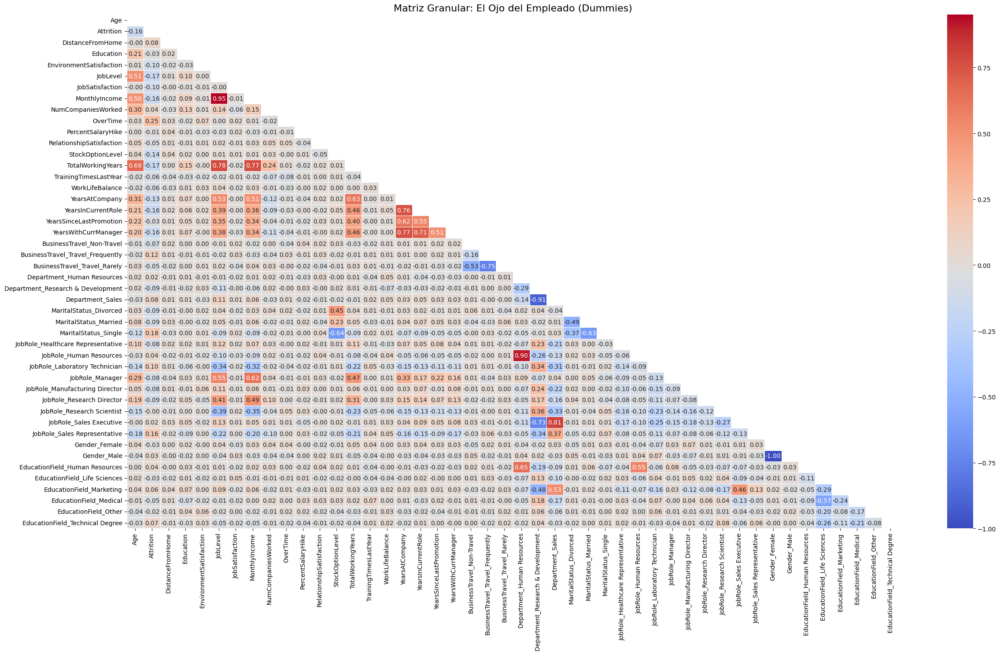

In [10]:
df_eda = df.copy()
cols_drop = ['DailyRate','EmployeeCount','EmployeeNumber','HourlyRate','JobInvolvement','MonthlyRate', 'Over18', 'PerformanceRating','StandardHours']
df_eda.drop(columns=cols_drop, inplace=True)

# Convertimos a dummies
df_eda['Attrition'] = df_eda['Attrition'].apply(lambda x: 1 if x == 'Yes' else 0)
df_eda['OverTime'] = df_eda['OverTime'].apply(lambda x: 1 if x == 'Yes' else 0)
df_eda = pd.get_dummies(df_eda, columns=['BusinessTravel', 'Department', 'MaritalStatus','JobRole','Gender','EducationField'], drop_first=False)

corr_granulada = df_eda.corr()

mask = np.triu(np.ones_like(corr_granulada, dtype=bool))

plt.figure(figsize=(25, 15))
sns.heatmap(corr_granulada, mask=mask, cmap='coolwarm', annot=True, fmt=".2f", linewidths=0.5)
plt.title('Matriz Granular: El Ojo del Empleado (Dummies)', fontsize=16)
plt.tight_layout()
plt.show()

### DATOS

JobLevel y MonthlyIncome muy correlacionados (0.95), posible problema de multicolinealidad. Tal vez necesitmos eliminar una de ellas, en este caso JobLevel.
JobLevel y TotalWorkingYears altamente correlacionadas (0.78). Misma situación, JobLevel candidata a ser eliminada.
En general JobLevel se encuentra muy correlacionada con aquellas variables de dimensión temporal dentro da la empresa.


**Attrition** y **OverTime** correlación de .25. Variable importante a seguir, realizar horas extra acelera el riesgo de fuga.
A mayor MonthlyIncome, menor riesgo de fuga. Misma situación con satisfación laboral, un buen ambiente reduce el riesgo de fuga.
En relación a StockLevelOption, cuantas más acciones tenga un empleado, menor riesgo de fuga. Correlación negativa. Por otro lado, las variables de dimensión temporal años en el trabajo, en el mismo puesto o con el mismo gerente, tienen relación negativa, por tanto la estabilidad reduce el riesgo de fuga. Otra relación a tener en cuenta es la **frecuencia de viaje**, aquellos que viajan con mayor regularidad, tienen mucho más riesgo de fuga (0.12). Los empleados que están solteros, aumenta el riesgo de fuga, que se puede deber a la facilidad que tienen de moverse al no tener nada que los retenga en un lugar concreto.

En cuanto a puestos de trabajo, los representantes de ventas, es decir, los que se encargan de realizar las ventas, representan un gran riesgo de fuga (0.16). Observando la relación de este rol con el salario mensual, se puede decir que no hay una correlación positiva, lo que podría indicar que uno de los factores de fuga en este rol es el salario que reciben. En cuanto a la variable **TotalWorkingYears**, esa tiene correlación negativa (-0.21), lo que nos indica que es un puesto que suele provocar un *burnout*. Tener que realizar ventas y ser quién da la cara no siempre es fácil de llevar. Observando otras variables de dimensión temporal, se puede ver como la correlación es negativa, dejando claro que es un puesto en el que la gente no dura muchos años.

Si bien es cierto que realizar horas extras tiene una muy fuerte relación con dejar la empresa, observando las horas extras con algún puesto específico, no hay ningún rol que destaque, siendo principalmente un tema personal.

La relación entre **StockoptionLevel** y las variables que representan el estado civil resulta curioso aunque lógico. Los empleados solteros, en relación al mayor riesgo de fuga que supone no tener anclas y disponer de movilidad, tienen una correlación negativa potente, indicando lo que ya se decía, son menos propensos a quedarse en la empresa, que también nos ayuda a determinar que estamos ante un grupo de empleados que ocupan unos puestos más junior. Siendo esta relación totalmente positiva para aquellos empleados que están casados o separados.

Como las variables relacionadas con los años dentro de la empresa se encuentra muy correlacionadas entre si, lo más probable es que presenten problemas de multicolinealidad dando lugar a su eliminación mediante un análisis VIF

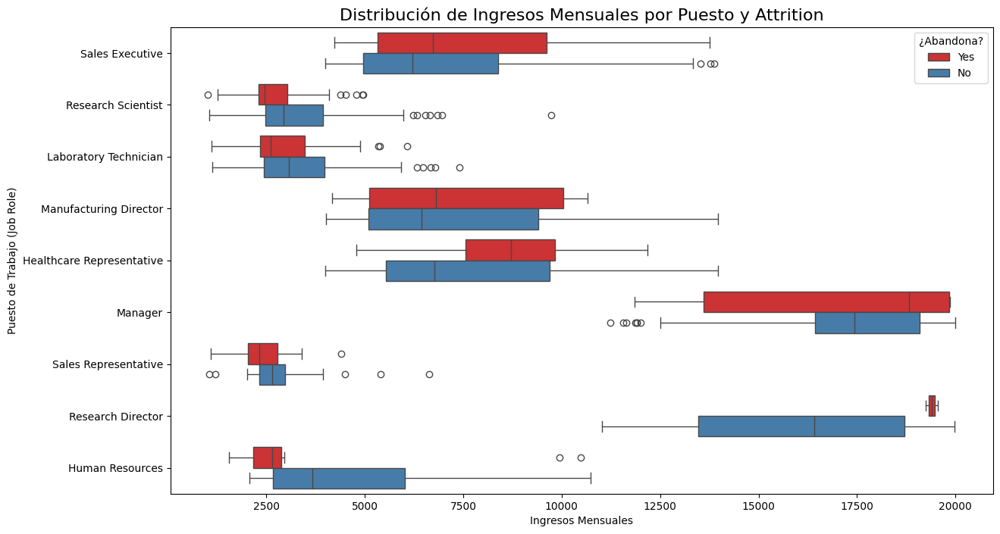

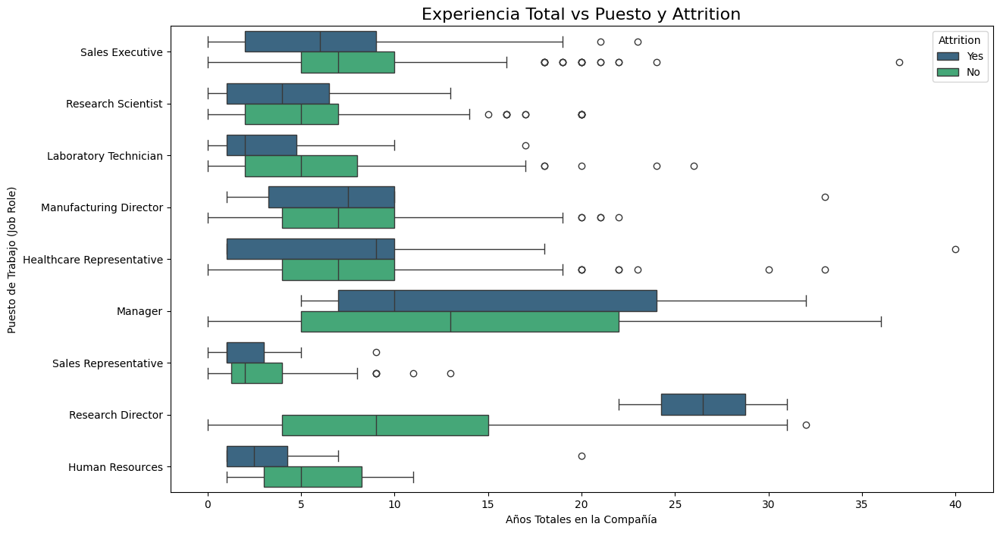

In [11]:
# 1. Boxplot de Salario Mensual por Puesto (con hue de Attrition)
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='MonthlyIncome', y='JobRole', hue='Attrition', palette='Set1')
plt.title('Distribución de Ingresos Mensuales por Puesto y Attrition', fontsize=16)
plt.xlabel('Ingresos Mensuales')
plt.ylabel('Puesto de Trabajo (Job Role)')
plt.legend(title='¿Abandona?')
plt.show()

plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='YearsAtCompany', y='JobRole', hue='Attrition', palette='viridis')
plt.title('Experiencia Total vs Puesto y Attrition', fontsize=16)
plt.xlabel('Años Totales en la Compañía')
plt.ylabel('Puesto de Trabajo (Job Role)')
plt.show()

Observando los diagramas de cajas se pueden sacar conclusiones más claras sobre el aporte de la matriz de correlación.

#### Sales Representative

Estamos ante el puesto de trabajo que menor remuneración tiene, tanto para aquellos que deciden quedarse como para los que cambian de empresa. Si miramos los años totales en ese puesto, se puede decir que estamos ante empleados de nivel junior y que utilizan este puesto como trampolín para posicionarse mejor a largo plazo en otro tipo de empresas. Los que se van en rara ocasión llegan a tener 5 años dentro de la empresa. Tal como se ha apuntado, ser quién da la cara cuando algo no le gusta al cliente tiene mucho desgaste.


#### Manager

A diferencia de los juniors de ventas, el manager no se va por un mal sueldo como es de esperar. La fuga en esta situación puede deberse a la ausencia de nuevos retos.

#### Laboratory Technician y Research Scientist

En estos puestos aquellos empleados que superan los 5 años y ven su sueldo aumentar, suelen quedarse más en el largo plazo.

Emplear la variable **YearsAtCompany** pone de relieve que la lealtad tiene un límite. Si aquellos que deciden quedarse no ven su salario aumentar sin duda alguna estarán encarando la puerta de salida más pronto que tarde.

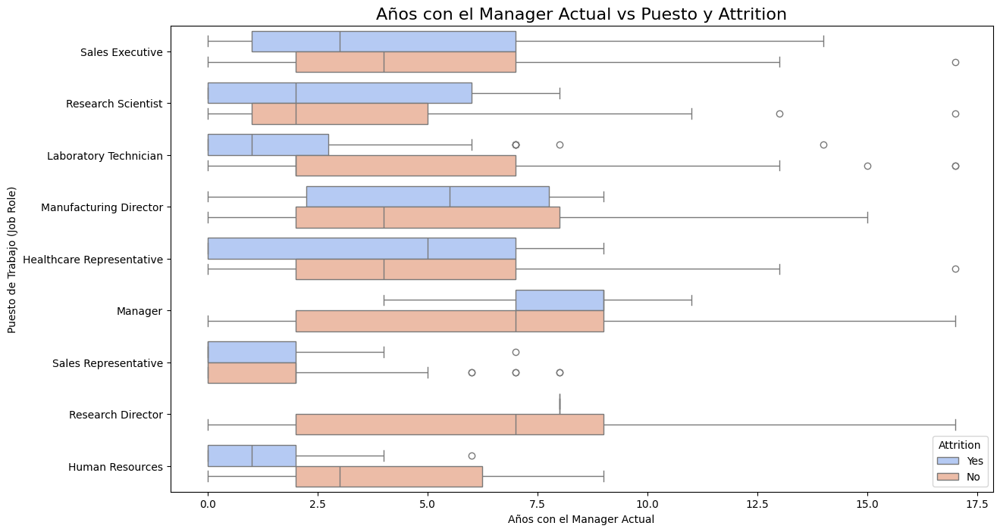

In [12]:
plt.figure(figsize=(14, 8))
sns.boxplot(data=df, x='YearsWithCurrManager', y='JobRole', hue='Attrition', palette='coolwarm')
plt.title('Años con el Manager Actual vs Puesto y Attrition', fontsize=16)
plt.xlabel('Años con el Manager Actual')
plt.ylabel('Puesto de Trabajo (Job Role)')
plt.show()

Observando finalmente la relación con el gerente, llegamos a la conclusión que una parte de los empleados que se van, no deciden cambiar de puesto de forma exclusiva por el salario. Su relación con el gerente parece no ser buena y prefieren irse a tener que seguir en esa situación. Para el puesto de **Sales Representative**, este no parece ser un factor determinante ya que la relación con el gerente tanto si se van como si se quedan parece cambiar en un período de tiempo muy corto, siendo la principal conclusión para este puesto, el bajo salario y ser el que da la cara ante los problemas.

### Análisis Factor de Inflación de la Varianza (VIF)

Volvemos a crear una copia del dataset original para aplicar drop_first=True a la hora de crear dummies.

El VIF nos permite decidir de forma controlada que variables eliminamos y tenemos en cuenta. Si aplicasemos regularizaciones L1 o L2, el algorimto decidiría de forma interna sin que pudiesemos tener control sobre lo que pasa.

In [13]:
df_dummies = df.copy()
cols_drop.append('EducationField')
cols_drop.append('Department')
df_dummies.drop(columns=cols_drop, inplace=True)
df_dummies['Attrition'] = df_dummies['Attrition'].apply(lambda x: 1 if x == 'Yes' else 0)
df_dummies['OverTime'] = df_dummies['OverTime'].apply(lambda x: 1 if x == 'Yes' else 0)
df_dummies = pd.get_dummies(df_dummies, columns=['BusinessTravel', 'MaritalStatus','JobRole','Gender'], drop_first=True, dtype=int)
df_dummies.drop(columns=['Attrition','JobLevel','TotalWorkingYears','Age','PercentSalaryHike','WorkLifeBalance'], inplace=True)
df_dummies.head()

,DistanceFromHome,Education,EnvironmentSatisfaction,JobSatisfaction,MonthlyIncome,NumCompaniesWorked,OverTime,RelationshipSatisfaction,StockOptionLevel,TrainingTimesLastYear,...,MaritalStatus_Single,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,Gender_Male
0,1,2,2,4,5993,8,1,1,0,0,...,1,0,0,0,0,0,0,1,0,0
1,8,1,3,2,5130,1,0,4,1,3,...,0,0,0,0,0,0,1,0,0,1
2,2,2,4,3,2090,6,1,2,0,3,...,1,0,1,0,0,0,0,0,0,1
3,3,4,4,3,2909,1,1,3,0,3,...,0,0,0,0,0,0,1,0,0,0
4,2,1,1,2,3468,9,0,4,1,3,...,0,0,1,0,0,0,0,0,0,1


In [14]:
vif_data = pd.DataFrame()
vif_data["Variable"] = df_dummies.columns
vif_data["VIF"] = [variance_inflation_factor(df_dummies.values, i) for i in range(df_dummies.shape[1])]

print(vif_data.sort_values(by="VIF", ascending=False))

                            Variable        VIF
4                      MonthlyIncome  16.584857
10                    YearsAtCompany   9.780951
1                          Education   8.535882
15      BusinessTravel_Travel_Rarely   7.292180
7           RelationshipSatisfaction   6.838375
2            EnvironmentSatisfaction   6.694596
3                    JobSatisfaction   6.597957
13              YearsWithCurrManager   6.542780
11                YearsInCurrentRole   6.459283
9              TrainingTimesLastYear   5.419333
17              MaritalStatus_Single   4.054083
20                   JobRole_Manager   3.439567
8                   StockOptionLevel   3.305733
23        JobRole_Research Scientist   3.300253
16             MaritalStatus_Married   3.183780
24           JobRole_Sales Executive   3.138351
19     JobRole_Laboratory Technician   3.045982
14  BusinessTravel_Travel_Frequently   2.696323
22         JobRole_Research Director   2.678339
26                       Gender_Male   2

A nivel global, vamos a eliminar las variables **JobLevel** y **Department**. Son variables que ya se encuentran explicadas por otros factores, en el caso de JobLevel, el salario es algo que nos permite explicar esta variable. Al empleado tal vez no le interese tanto su nivel de trabajo sinó el resultado final, que es el salario. En cuanto al departamento, ya contamos con la variable granular que nos indica el puesto que ocupa cada uno, por tanto de ahí se puede deducir el dpto. al que se pertenece.

### Regresión Logística

De cara a la regresión logística, como estamos ante un algoritmo de relaciones lineales, también vamos a eliminar **TotalWorkingYears** y **Age**. Los años totales trabajados se pueden explicar mediante el salario, un mayor salario por lo general va implicar una mayor experiencia lo que se traslada en una mayor cantidad de años trabajados. En cuanto a la variable edad, la situación va un poco en la misma línea, un salario elevado suele conllevar una mayor edad, por otro lado, tener información como el estado civil, nos sirve para aproximar la idea de la edad. Alguien que se encuentre soltero tiene más probabilidades de ser una persona joven con poca experiencia y un menor salario, situación contraria para los que se encuentran casados o separados.

Por otro lado, es muy importante ver como las variables que eran objeto de examen principal, como aquellas relacionadas con el tiempo en la empresa, mismo puesto o mismo gerente, presentan una colinealidad baja, indicando que el micro-clima laboral es muy importante. No importa tanto los años que tenga trabajados en total, sinó si situación interna actualmente.


Mapa empleado:
- Económico: explicado por salario mensual
- Trayectoria: explicado por años en compañía y puesto actual
- Liderazgo: explicado por años con el mismo gerente
